=== Bayesian Axion Signal Analysis ===
1. Generating data using your signal model...
Generating signal data using your exact model...
Generating signal using Equation 15...
Creating plots...


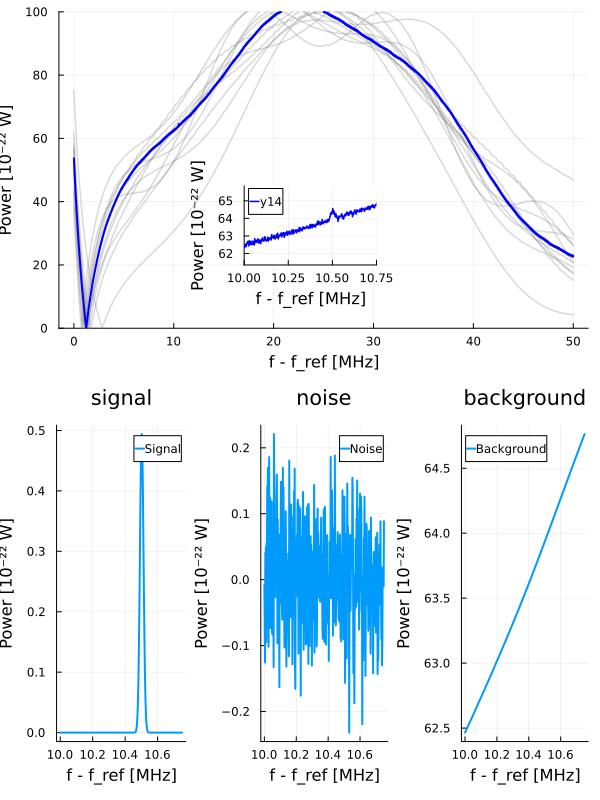

Applying Savitzky-Golay filter...


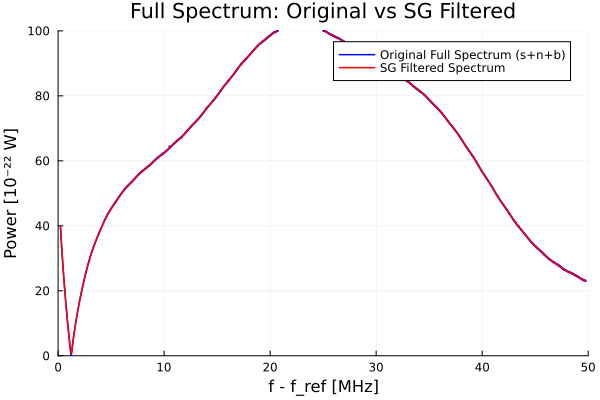

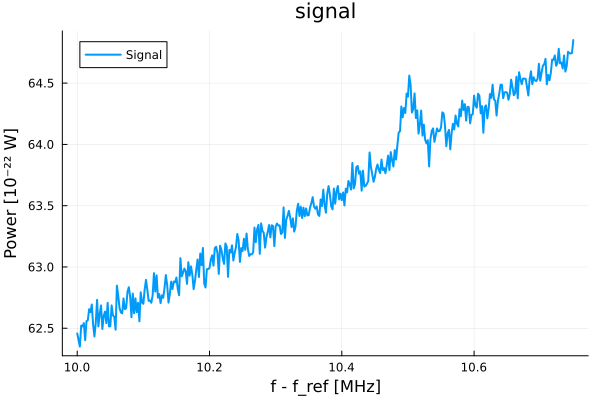

   True parameters:
   mₐ: 1.0850841554539025e-43 kg
   Cₐᵧ: 1.8
   σᵥ: 218.0 km/s
   Data loaded: 376 points in zoom range
   Estimated noise std: 0.090102
2. Plotting original signal...


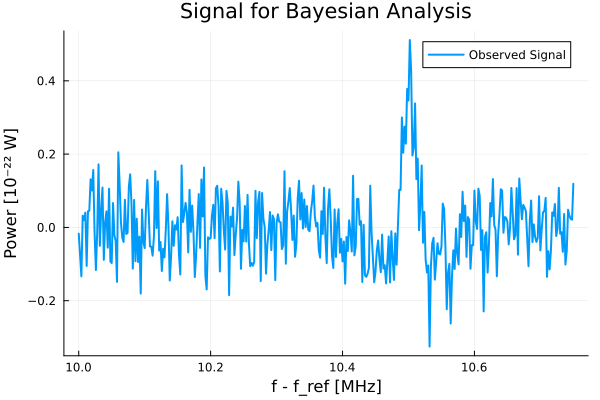

3. Running MCMC sampling...
Starting MCMC sampling...
Initial log posterior: 366.3544235893073
Iteration 500, Acceptance rate: 0.0, Log posterior: 366.35
Iteration 1000, Acceptance rate: 0.0, Log posterior: 366.35
Iteration 1500, Acceptance rate: 0.0, Log posterior: 366.35
Iteration 2000, Acceptance rate: 0.0, Log posterior: 366.35
Iteration 2500, Acceptance rate: 0.0, Log posterior: 366.35
Iteration 3000, Acceptance rate: 0.0, Log posterior: 366.35
MCMC completed. Final acceptance rate: 0.0
4. Calculating posterior statistics...

Posterior Summary:
Parameter    | Mean ± Std           | 95% CI                 | True Value
-------------|----------------------|------------------------|------------
%.3e1.0850841554539025e-43
%.3e0.0
[%.3e, %.3e]1.0850841554539025e-431.0850841554539025e-43
%.3e1.0850841554539025e-43
mₐ [kg]      | nothing  ± nothing  | nothing                | nothing
%.3f1.7999999999999974
%.3f2.6650683260776207e-15
[%.3f, %.3f]1.81.8
%.3f1.8
Cₐᵧ          | nothing  ± not

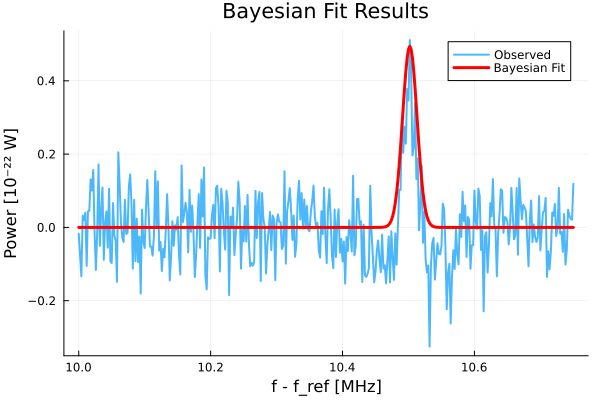

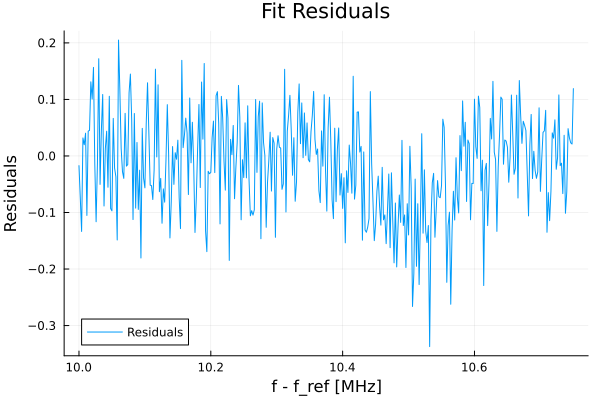

7. Computing 68% Posterior Predictive Interval...
8. Plotting Bayesian Fit with 68% Posterior Predictive Interval...


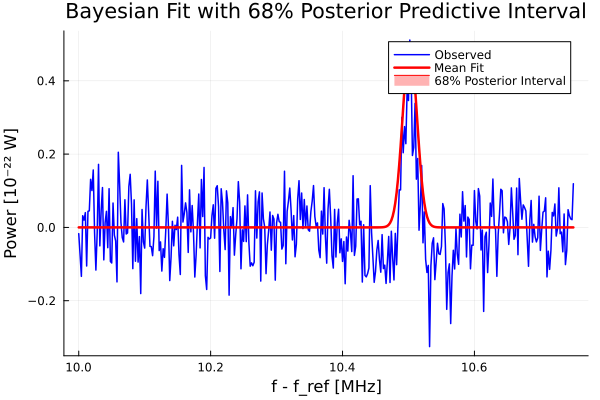

In [8]:
using Plots, Random, Statistics, LinearAlgebra, Distributions, SpecialFunctions, Optim

# Constants (from your code)
c = 299792458.0                    # Speed of light [m/s]
ħ = 1.054571817e-34                # Reduced Planck constant [J s]
α = 1/137.036                      # Fine structure constant
qₑ = 1.602176634e-19               # Elementary charge [C]

# Fixed experimental parameters from your Table 1
ρₐ_fixed = 0.3e9 * 1.602176634e-10  # Axion density [J/m^3] (0.3 GeV cm^-3)
Bₑ_fixed = 10.0                     # Magnetic field [T]
A_fixed = 1.0                       # Area [m^2]
β²_fixed = 5e4                      # Power boost factor
v_lab_fixed = 242e3                 # Lab velocity [m/s] (242 km s^-1)

# Broadening function (from your code)
function broaden_signal(signal_array, freq_array, broadening_factor=1.5)
    if broadening_factor == 1.0
        return signal_array
    end
    
    broadened = zeros(length(signal_array))
    kernel_width = broadening_factor * 0.2e6  # 0.2 MHz base width
    
    for (i, f) in enumerate(freq_array)
        if signal_array[i] > 0
            for (j, f_target) in enumerate(freq_array)
                weight = exp(-0.5 * ((f - f_target) / kernel_width)^2)
                broadened[j] += signal_array[i] * weight
            end
        end
    end
    
    # Normalize to preserve peak amplitude
    if maximum(broadened) > 0
        broadened *= maximum(signal_array) / maximum(broadened)
    end
    
    return broadened
end

# Your exact axion signal power function
function axion_signal_power(ω::Float64, mₐ::Float64, Cₐᵧ::Float64, σᵥ::Float64, v_lab::Float64)
    ω_threshold = mₐ * c^2 / ħ
    if ω <= ω_threshold
        return 0.0
    end
    
    # CRITICAL FIX: Add safety check for the square root argument
    sqrt_arg = 1 - ((mₐ * c^2) / (ħ * ω))^2
    if sqrt_arg <= 0.0
        return 0.0  # Return 0 instead of NaN when square root would be imaginary
    end
    
    v_ω = c * sqrt(sqrt_arg)
    fₐ = mₐ * c^2 / ħ
    gₐᵧ = (α / (2π * fₐ)) * Cₐᵧ
    
    prefactor = (ρₐ_fixed / mₐ^2) * gₐᵧ^2 * Bₑ_fixed^2 * A_fixed * β²_fixed * (qₑ / ħ)
    σᵥ² = σᵥ^2
    sqrt_factor = sqrt(2 / (π * σᵥ²))/v_lab
    exp_factor = exp(-(v_ω^2 + v_lab^2) / (2 * σᵥ²))
    sinh_factor = sinh((v_ω * v_lab) / σᵥ²)
    
    result = prefactor * sqrt_factor * v_ω * exp_factor * sinh_factor
    
    # Additional safety check for the final result
    if isnan(result) || isinf(result)
        return 0.0
    end
    
    return result
end

# Your exact Savitzky-Golay filter implementation
function savitzky_golay_filter(data, window_length, poly_order)
    """
    Apply Savitzky-Golay filter to data
    
    Parameters:
    - data: input data array
    - window_length: number of data points in the filter window (must be odd)
    - poly_order: order of polynomial used for fitting
    
    Returns:
    - filtered_data: smoothed data array
    """
    if window_length % 2 == 0
        error("Window length must be odd")
    end
    
    if poly_order >= window_length
        error("Polynomial order must be less than window length")
    end
    
    # Half window size
    half_window = window_length ÷ 2
    
    # Create coefficient matrix for least squares fitting
    # We need to solve for polynomial coefficients that minimize
    # the least squares error over the window
    
    # Create design matrix for polynomial fitting
    x_vals = -half_window:half_window
    A = zeros(window_length, poly_order + 1)
    
    for i in 1:window_length
        for j in 0:poly_order
            A[i, j+1] = x_vals[i]^j
        end
    end
    
    # Compute the convolution coefficients
    # We want the coefficient for the central point (derivative = 0)
    coeffs = (A' * A) \ A'  # Moore-Penrose pseudoinverse
    central_coeffs = coeffs[1, :]  # Coefficients for 0th derivative (smoothing)
    
    # Apply filter
    filtered_data = copy(data)
    n = length(data)
    
    for i in (half_window + 1):(n - half_window)
        window_data = data[(i - half_window):(i + half_window)]
        filtered_data[i] = dot(central_coeffs, window_data)
    end
    
    return filtered_data
end

# Generate your exact signal data using your complete code
function generate_signal_data()
    println("Generating signal data using your exact model...")
    
    # Your frequency grid (exact copy)
    N = 25000
    Δf = 2.e3
    f₀ = 4.218e6
    frequencies = f₀ .+ (0:N-1) * Δf
    freq_MHz = (frequencies .- f₀) / 1e6
    
    # Your signal parameters (exact copy)
    f_axion = f₀ + 10.5e6  # This will make the signal appear at 10.5 MHz relative to f_ref
    mₐ_true = ħ * 2π * f_axion / c^2
    Cₐᵧ_true = 1.8  # QCD anomaly ratio (Eq. 16)
    σᵥ_true = 218e3  # Velocity dispersion [m/s] (218 km s^-1)
    
    # Generate signal using your exact equation (exact copy)
    println("Generating signal using Equation 15...")
    signal = broaden_signal([axion_signal_power(2π * f, mₐ_true, Cₐᵧ_true, σᵥ_true, v_lab_fixed) for f in frequencies], frequencies, 0.055)
    
    # Apply your exact signal scaling (exact copy)
    signal_scale_factor = 0.7*1e20  # Adjust this to get the right amplitude
    signal .*= signal_scale_factor
    
    # Generate noise (exact copy)
    noise_std = 0.08  # Smaller noise to match figure
    Random.seed!(42)
    noise = noise_std * randn(N)
    
    # Generate background using your exact function (exact copy)
    function generate_background(f_array, f_ref, seed_val=42)
        Random.seed!(seed_val)  # Use different seeds for different realizations
        r = randn(8)
        bg = zeros(length(f_array))
        
        for (i, f) in enumerate(f_array)
            f_rel = f - f_ref
            
            # Original equation 21 terms but scaled appropriately
            term1 = 1e-20 * (erf((f_rel - f_ref) / (5e6)) * (f_ref / f)^3 +
                             exp(-((f_rel - 25e6 * (1 + r[1]/15)) / (20e6 * (1 + r[2]/10)))^2))
            term2 = 4e-22 * (1 + r[3]) * sin((f_rel + r[4] * f_ref) / (2.5e6))
            term3 = 5e-24 * ((1 + r[5]) * sin((f_rel + r[6] * f_ref) / (0.25e6)) +
                             (1 + r[7]) * sin((f_rel + r[8] * f_ref) / (0.1e6)))
            
            bg[i] = abs(term1 + term2 + term3)
        end
        
        # Scale to match the figure levels (~84 units at zoom region)
        # Add some base level variation between realizations
        base_variation = 8.0 * randn()  # Random offset for each realization
        bg = bg * 1e22 * 1
        
        return bg
    end
    background = generate_background(frequencies, f₀, 42)
    
    # Final observed power
    observed = signal + noise + background
    println("Creating plots...")

    p_main = plot(xlabel="f - f_ref [MHz]", ylabel="Power [10⁻²² W]", 
              legend=false, ylim=(0, 100))
    for i in 1:12
        bgsample = generate_background(frequencies, f₀, i * 13)  # Different seeds
        plot!(p_main, freq_MHz, bgsample, color=:gray, alpha=0.3, lw=1.5, label="")
    end
    plot!(p_main, freq_MHz, observed, label="Total", lw=2, color=:blue)
    zoom_range = findall(x -> 10.0 <= x <= 10.75, freq_MHz)
    zoom_freq = freq_MHz[zoom_range]
    zoom_observed = observed[zoom_range]
    plot!(p_main, zoom_freq, zoom_observed,
          inset = (1, bbox(0.35, 0.55, 0.25, 0.25)), 
        subplot=2, lw=1.5, color=:blue, 
        xlabel="f - f_ref [MHz]", ylabel="Power [10⁻²² W]",
        xlim=(10.0, 10.75), ylim=(minimum(zoom_observed)-1, maximum(zoom_observed)+1))

# Bottom panels 
    p1 = plot(freq_MHz[zoom_range], signal[zoom_range], label="Signal", lw=2, 
          xlabel="f - f_ref [MHz]", ylabel="Power [10⁻²² W]", title="signal")
    p2 = plot(freq_MHz[zoom_range], noise[zoom_range], label="Noise", lw=2, 
          xlabel="f - f_ref [MHz]", ylabel="Power [10⁻²² W]", title="noise")
    p3 = plot(freq_MHz[zoom_range], background[zoom_range], label="Background", lw=2, 
          xlabel="f - f_ref [MHz]", ylabel="Power [10⁻²² W]", title="background")
    final_plot = plot(p_main, p1, p2, p3, layout = @layout([a; b c d]), size=(600,800))

    display(final_plot)
    println("Applying Savitzky-Golay filter...")
    sg_window_length = 221  
    sg_poly_order = 4      
    
    # Apply SG filter to raw data
    filtered_data = savitzky_golay_filter(observed, sg_window_length, sg_poly_order)
    boundary_cut = 110
    valid_indices = (boundary_cut + 1):(N - boundary_cut)
    freq_valid = freq_MHz[valid_indices]
    raw_valid = observed[valid_indices]
    filtered_valid = filtered_data[valid_indices]
    residual_data = raw_valid - filtered_valid
    p_full = plot(freq_valid, raw_valid, label="Original Full Spectrum (s+n+b)", lw=1.5, color=:blue,
              xlabel="f - f_ref [MHz]", ylabel="Power [10⁻²² W]", 
              title="Full Spectrum: Original vs SG Filtered",
              xlim=(0, 50), ylim=(0, 100))

    plot!(p_full, freq_valid, filtered_valid, label="SG Filtered Spectrum", 
      lw=1.5, color=:red)
    display(p_full)
    pp=plot(freq_MHz[zoom_range], observed[zoom_range], label="Signal", lw=2, 
          xlabel="f - f_ref [MHz]", ylabel="Power [10⁻²² W]", title="signal")
    display(pp)          
    
    return freq_valid, residual_data, mₐ_true, Cₐᵧ_true, σᵥ_true, raw_valid, filtered_valid
end

function axion_model(freq_Hz_array, params)
    mₐ, Cₐᵧ, σᵥ = params
    raw_signal = [axion_signal_power(2π * f, mₐ, Cₐᵧ, σᵥ, v_lab_fixed) for f in freq_Hz_array]
    broadened_signal = broaden_signal(raw_signal, freq_Hz_array, 0.055)
    signal_scale_factor = 0.7*1e20
    return broadened_signal .* signal_scale_factor
end

# Define log likelihood
function log_likelihood(params, freq_MHz, observed_signal, noise_std)
    f₀ = 4.218e6
    freq_Hz = f₀ .+ freq_MHz * 1e6  
    model_signal = axion_model(freq_Hz, params)
    if any(isnan.(model_signal)) || any(isinf.(model_signal))
        return -Inf
    end
        # Gaussian likelihood
    residuals = observed_signal .- model_signal
    return -0.5 * sum((residuals ./ noise_std).^2) - length(residuals) * log(sqrt(2π) * noise_std)
end

function log_prior(params)
    mₐ, Cₐᵧ, σᵥ = params
    
    # Convert mₐ to frequency for bounds checking
    f_axion = mₐ * c^2 / (ħ * 2π)
    f₀ = 4.218e6
    freq_MHz_axion = (f_axion - f₀) / 1e6
    if freq_MHz_axion < 9.5 || freq_MHz_axion > 11.5
        return -Inf
    end
    if Cₐᵧ < 0.86 || Cₐᵧ > 5.0
        return -Inf
    end
    σᵥ_prior = logpdf(Normal(218e3, 39e3), σᵥ)
    
    return σᵥ_prior
end

# Define log posterior
function log_posterior(params, freq_MHz, observed_signal, noise_std)
    lp = log_prior(params)
    if lp == -Inf
        return -Inf
    end
    return lp + log_likelihood(params, freq_MHz, observed_signal, noise_std)
end

# Metropolis-Hastings MCMC sampler
function mcmc_sample(freq_MHz, observed_signal, noise_std, n_samples=5000, n_burn=1000)
    # Initialize parameters near expected values
    f₀ = 4.218e6
    f_axion_init = f₀ + 10.5e6  # Start near the true peak
    mₐ_init = ħ * 2π * f_axion_init / c^2
    
    current_params = [
        mₐ_init,    # mₐ
        1.8,        # Cₐᵧ (your true value)
        218e3       # σᵥ (mean of prior)
    ]
    
    # Proposal covariance (adjusted for parameter scales)
    proposal_std = [
        mₐ_init * 0.01,  # 1% of mₐ
        0.2,             # Cₐᵧ step
        20e3             # σᵥ step (20 km/s)
    ]
    
    samples = zeros(n_samples, 3)
    current_logp = log_posterior(current_params, freq_MHz, observed_signal, noise_std)
    
    n_accepted = 0
    
    println("Starting MCMC sampling...")
    println("Initial log posterior: $current_logp")
    
    for i in 1:n_samples
        # Propose new parameters
        proposal = current_params .+ proposal_std .* randn(3)
        
        # Calculate log posterior for proposal
        proposal_logp = log_posterior(proposal, freq_MHz, observed_signal, noise_std)
        
        # Accept/reject
        if log(rand()) < (proposal_logp - current_logp)
            current_params = proposal
            current_logp = proposal_logp
            n_accepted += 1
        end
        
        samples[i, :] = current_params
        
        if i % 500 == 0
            acceptance_rate = n_accepted / i
            println("Iteration $i, Acceptance rate: $(round(acceptance_rate, digits=3)), Log posterior: $(round(current_logp, digits=2))")
        end
    end
    
    println("MCMC completed. Final acceptance rate: $(round(n_accepted/n_samples, digits=3))")
    
    # Return samples after burn-in
    return samples[(n_burn+1):end, :]
end

# Main analysis function
function run_bayesian_analysis()
    println("=== Bayesian Axion Signal Analysis ===")
    
    # Generate data using your exact model
    println("1. Generating data using your signal model...")
    freq_valid, final_signal, mₐ_true, Cₐᵧ_true, σᵥ_true, raw_valid, filtered_valid = generate_signal_data()
    
    println("   True parameters:")
    println("   mₐ: $(mₐ_true) kg")
    println("   Cₐᵧ: $(Cₐᵧ_true)")
    println("   σᵥ: $(σᵥ_true/1e3) km/s")
    

    
    # Define zoom range around the signal peak (10.0 to 10.75 MHz to match your original)
    zoom_indices = findall(x -> 10.0 <= x <= 10.75, freq_valid)
    freq_zoom = freq_valid[zoom_indices]
    signal_zoom = final_signal[zoom_indices]  # This is the residual_data = raw_valid - filtered_valid
    
    println("   Data loaded: $(length(freq_zoom)) points in zoom range")
    
    # Estimate noise level
    noise_std = std(signal_zoom[1:50])  # Estimate from early part
    println("   Estimated noise std: $(round(noise_std, digits=6))")
    
    # Plot original signal
    println("2. Plotting original signal...")
    p1 = plot(freq_zoom, signal_zoom, label="Observed Signal", 
              xlabel="f - f_ref [MHz]", ylabel="Power [10⁻²² W]", 
              title="Signal for Bayesian Analysis", linewidth=2)
    display(p1)
    
    # Run MCMC
    println("3. Running MCMC sampling...")
    samples = mcmc_sample(freq_zoom, signal_zoom, noise_std, 3000, 500)
    
    # Calculate posterior statistics
    println("4. Calculating posterior statistics...")
    param_names = ["mₐ [kg]", "Cₐᵧ", "σᵥ [km/s]"]
    
    println("\nPosterior Summary:")
    println("Parameter    | Mean ± Std           | 95% CI                 | True Value")
    println("-------------|----------------------|------------------------|------------")
    
    posterior_means = zeros(3)
    for i in 1:3
        mean_val = mean(samples[:, i])
        std_val = std(samples[:, i])
        ci_low = quantile(samples[:, i], 0.025)
        ci_high = quantile(samples[:, i], 0.975)
        
        posterior_means[i] = mean_val
        
        # Format based on parameter type
        if i == 1  # mₐ
            true_val = mₐ_true
            mean_str = println("%.3e", mean_val)
            std_str = println("%.3e", std_val)
            ci_str = println("[%.3e, %.3e]", ci_low, ci_high)
            true_str = println("%.3e", true_val)
        elseif i == 2  # Cₐᵧ
            true_val = Cₐᵧ_true
            mean_str = println("%.3f", mean_val)
            std_str = println("%.3f", std_val)
            ci_str = println("[%.3f, %.3f]", ci_low, ci_high)
            true_str = println("%.3f", true_val)
        else  # σᵥ
            true_val = σᵥ_true/1e3  # Convert to km/s for display
            mean_str = println("%.1f", mean_val/1e3)
            std_str = println("%.1f", std_val/1e3)
            ci_str = println("[%.1f, %.1f]", ci_low/1e3, ci_high/1e3)
            true_str = println("%.1f", true_val)
        end
        
        println("$(rpad(param_names[i], 12)) | $(rpad(mean_str, 8)) ± $(rpad(std_str, 8)) | $(rpad(ci_str, 22)) | $true_str")
    end
    
    # Generate fitted signal
    println("5. Generating fitted signal...")
    f₀ = 4.218e6
    freq_Hz_zoom = f₀ .+ freq_zoom * 1e6
    fitted_signal = axion_model(freq_Hz_zoom, posterior_means)
    
    # Plot comparison
    println("6. Plotting fitted results...")
    p2 = plot(freq_zoom, signal_zoom, label="Observed", linewidth=2, alpha=0.7)
    plot!(p2, freq_zoom, fitted_signal, label="Bayesian Fit", linewidth=3, color=:red)
    plot!(p2, xlabel="f - f_ref [MHz]", ylabel="Power [10⁻²² W]", 
          title="Bayesian Fit Results")
    display(p2)
    
    # Plot residuals
    residuals = signal_zoom .- fitted_signal
    p3 = plot(freq_zoom, residuals, label="Residuals", linewidth=1)
    plot!(p3, xlabel="f - f_ref [MHz]", ylabel="Residuals", 
          title="Fit Residuals")
    display(p3)
        println("7. Computing 68% Posterior Predictive Interval...")

    # Compute model predictions for a subset of posterior samples
    n_posterior_samples = 500  # Use subset for speed/memory
    chosen_indices = rand(1:size(samples, 1), n_posterior_samples)

    predictions = zeros(n_posterior_samples, length(freq_Hz_zoom))
    for (i, idx) in enumerate(chosen_indices)
        params_sample = samples[idx, :]
        predictions[i, :] = axion_model(freq_Hz_zoom, params_sample)
    end

    # Compute 16th, 50th, and 84th percentiles (i.e., 68% credible interval)
    lower_bound = mapslices(x -> quantile(x, 0.16), predictions; dims=1)[:]
    upper_bound = mapslices(x -> quantile(x, 0.84), predictions; dims=1)[:]
    median_fit = mapslices(x -> quantile(x, 0.5), predictions; dims=1)[:]

    # Plot with 68% interval band
    println("8. Plotting Bayesian Fit with 68% Posterior Predictive Interval...")
    p4 = plot(freq_zoom, signal_zoom, label="Observed", lw=1.5, color=:blue)
    plot!(p4, freq_zoom, fitted_signal, label="Mean Fit", lw=2.5, color=:red)
    plot!(p4, freq_zoom, lower_bound, fillrange=lower_bound, fillalpha=0.3,
          label="68% Posterior Interval", color=:red)
    plot!(p4, xlabel="f - f_ref [MHz]", ylabel="Power [10⁻²² W]",
          title="Bayesian Fit with 68% Posterior Predictive Interval")
    display(p4)

    
    return samples, posterior_means, freq_zoom, signal_zoom, fitted_signal,upper_bound
end

# Run the analysis
samples, means, freq, observed, fitted = run_bayesian_analysis();

In [3]:
import Pkg
Pkg.add("NestedSamplers")

   Resolving package versions...
  No Changes to `C:\Users\Lenovo\Documents\GitHub\Dark_Matter_Magnetized_Disc_Mirror_Axion_Dielectric_Haloscope_Experiment\Project.toml`
  No Changes to `C:\Users\Lenovo\Documents\GitHub\Dark_Matter_Magnetized_Disc_Mirror_Axion_Dielectric_Haloscope_Experiment\Manifest.toml`


In [4]:
import Pkg
Pkg.add("ForwardDiff")

   Resolving package versions...
    Updating `C:\Users\Lenovo\Documents\GitHub\Dark_Matter_Magnetized_Disc_Mirror_Axion_Dielectric_Haloscope_Experiment\Project.toml`
⌅ [f6369f11] + ForwardDiff v0.10.38
  No Changes to `C:\Users\Lenovo\Documents\GitHub\Dark_Matter_Magnetized_Disc_Mirror_Axion_Dielectric_Haloscope_Experiment\Manifest.toml`


# Constants 

In [6]:
using ForwardDiff
using BAT
using DataFrames

using ValueShapes, IntervalSets
using Distributions, SpecialFunctions, Random

using Plots, LaTeXStrings
using Statistics, StatsBase
using LinearAlgebra
using SavitzkyGolay
using UltraNest

"""
    All relevant fundamental constants.
"""
struct Constants
    c::Float64
    h_eV::Float64
    h_J::Float64
    qe::Float64
    eps0::Float64
    hbar_J::Float64
    hbar_eV::Float64
end

function SeedConstants()
    h_eV = 4.135667696e-15 # [eVs]
    h_J = 6.62607015e-34 # [Js]
    c = 299792458.0 # [m/s]
    qe = 1.602176634e-19 # [C]
    eps0 = 8.8541878128e-12 # [F/m]
    hbar_J = 1.054571817e-34 # [Js]
    hbar_eV = 6.582119569e-16 # [eVs]
    return Constants(c,h_eV,h_J,qe,eps0,hbar_J, hbar_eV)
end

"""
    All relevant experimental parameters.
"""
struct Experiment
    Be::Float64 # external magnetic field [T]
    A::Float64 # surface of dielectric disks [m^2]
    β::Union{Float64, Vector{Float64}} # Boost factor (assumed to be constant over this frequency range) []
    t_int::Float64 # integration time [s]
    Δω::Float64 # integration frequency interval [Hz]
    f_ref::Float64 # absolute frequency where experiment was conducted. Will be added to data[:,1] [Hz]
end

function Experiment(;Be=10.0, A=1.0, β=5.0e4, t_int=100.0, Δω=1.0e3, f_ref=11.0e9)
    return Experiment(Be, A, β, t_int, Δω, f_ref)
end

"""
    All relevant theoretical/ cosmological/ nature parameters.
"""
mutable struct Theory
    ma::Union{Float64, ForwardDiff.Dual}
    rhoa::Union{Float64, ForwardDiff.Dual}
    EoverN::Union{Float64, ForwardDiff.Dual}
    σ_v::Union{Float64, ForwardDiff.Dual} #σ_v = 218.0 # [km/s] +/- 6 according to 1209.0759
    vlab::Union{Float64, ForwardDiff.Dual}
end

function Theory(;ma=45.501, rhoa=0.3, EoverN=0.924, σ_v=218.0, vlab=242.1)
    return Theory(ma, rhoa, EoverN, σ_v, vlab)
end

"""
    Calculates power from a given photon count (and frequency and integration time).
    Beware: Counts do always come within a certain frequency interval. This formula implies that f is the mean
    of this interval.
"""
function Power(counts, f, Δt; c::Constants=SeedConstants())
    return f .* c.h_J .* counts ./ Δt
end

"""
    Calculates photon counts for a given power observed within a given frequency interval f_interval over time Δt.
    Be careful to choose f_interval small enough, otherwise you need an integration!
"""
function Counts(power, f_interval, Δt; c::Constants=SeedConstants())
    f = mean(f_interval)
    Δf = maximum(f_interval) - minimum(f_interval)
    return power .* Δt ./ ( f .* c.h_J ) * Δf
end

function deBroglie(mass, v=1e-3; c::Constants=SeedConstants())
    # mass::[eV]
    # v::[c]

    λdB = (c.h_eV * c.c) ./ (mass .* v)
end

"""
    Inverse of mass().
    Relativistic implementation.
"""
function freq(mass; v=0.0, c::Constants=SeedConstants())
    # mass::[eV]
    # v:: [c]
    
    # Derived from (hν)² = E² = (pc)² + (m₀c²)²
    ν = sqrt.(v.^2.0 .+ 1) .* mass ./ (c.h_eV) # [Hz]
end

"""
    Inverse of freq()
"""
function mass(freq; v=0.0, c::Constants=SeedConstants())
    # freq::[Hz]
    # v:: [c]
    m = freq .* c.h_eV ./ sqrt.(v.^2.0 .+ 1) # [eV]
end

"""
    The same as above, but solved for v. If freq < mass will return 0 instead of error!
    Freq and mass must be floats!
"""
function velocity(freq, mass; c::Constants=SeedConstants())
    # freq::[Hz]
    # mass::[eV]
    if freq >= mass / c.h_eV
        sqrt((freq / (mass / c.h_eV))^2.0 - 1.0)
    else
        0.0
    end
end

"""
    Determine prediction for central signal frequency depending on axion mass.
"""
function mu(logmass, f_ref; velo=0.0)
    # Calculate absolute frequency in Hz:
    f = freq(10.0.^logmass, v=velo)
    # Subtract reference frequency
    return f - f_ref
end

"""
    Calculate axion speed from logma and f. Same formula as used for freq() and mass().
"""
function speed(logma, f, c::Constants=SeedConstants())
    return sqrt(abs((c.h_eV * f / 10.0^logma).^2.0 .-1.0))
end


"""~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
|                                                                                           |
|                             Axion Properties                                              |
|                                                                                           |
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~"""

"""
    From 1511.02867.
    Uncertainty 5.70±0.07
"""
function ma(fa) #::[eV]
    # fa::[eV]
    return 5.70e-6 * (1e21/fa) 
end

function fa(ma)
    return 1e21 * (5.70e-6/ma)
end

αem(c::Constants=SeedConstants()) = c.qe^2 / (4*pi* c.eps0 * c.hbar_J * c.c)

function gaγγ(fa, EoverN) #::[eV^-1]
    return αem() / (2.0 * pi * fa) * abs(EoverN - 1.92)
end

function EoverN(fa, gaγγ, c::Constants=SeedConstants())
    return - 2*pi * fa * gaγγ / αem() + 1.92
end


"""~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
|                                                                                           |
|                             Signal shape, etc                                             |
|                                                                                           |
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~"""

"""
    Galactic velocity distribution in 1D.
    Formula 23 from 1701.03118v2.
    If change this to implement a different DM velocity model
"""
function velocity_distribution(v, σ_v, vlab) #::[1/c]
    # v::[c]
    # σ_v::[c]

    # Maxwell-Boltzmann distribution
    return pdf.(BoostedMaxwellBoltzmann(σ_v, vlab), v)
end

"""
    Computes dv/dω in [1/Hz].
"""
function dvdω(ω, ma; c::Constants=SeedConstants()) #::[1/Hz]
    # ω::[Hz]
    # ma::[eV]
    if ω >= ma/c.h_eV
        ω / ((ma/c.h_eV)^2. * sqrt((ω*c.h_eV/ma)^2.0 - 1.0))
    else
        0.0
    end
end

function signal_powerspectrum(ω, th::Theory, ex::Experiment; c::Constants=SeedConstants()) #::[eV^2 1/Hz]
    # ω::[Hz]   
    # σ_v::[c]
    # rhoa::[GeV/cm^3]
    # ma::[eV]
    ma = scale_ma(th.ma)
    σ_v = scale_σv(th.σ_v)
    vlab = scale_σv(th.vlab)

    v = velocity.(ω, ma) # in []

    prefactor = signal_prefactor(th, ex; c=c)
    sp =  prefactor .* velocity_distribution(v, σ_v, vlab) .* dvdω.(ω, ma) #::[1e-27 J/s 1/Hz] (if scaling = 1e27)
    return sp  
end

function signal_prefactor(th::Theory, ex::Experiment; scaling=1e27, c::Constants=SeedConstants())
    ma = scale_ma(th.ma)

    # convert rhoa from [GeV/cm^3] to [eV^4]
    rhoa = th.rhoa * 1e9 * 1e6 * c.c^3.0 * c.hbar_eV^3.0

    # convert rhoa from [GeV/cm^3] to [eV^2/m^2]
    #rhoa = rhoa * 1e9 * 1e6 * c.c * c.hbar_eV

    gag = gaγγ(fa(ma),th.EoverN) # [eV^-1]

    # convert Be from [T] to [eV^2]
    Be = ex.Be * sqrt(c.eps0 * c.c^5.0 * c.hbar_J^3.0) / c.qe^2.0 # 4 * pi * [eV^2]

    # convert A from [m^2] to [eV^-2]
    A = ex.A / (c.c^2.0 * c.hbar_eV^2.0) # [eV^-2]

    # This prefactor returns 1.712 for the values used to calculate 2.6 in Knircks Thesis. Result from Knirck: 1.6
    prefactor = rhoa/ma^2.0 * gag^2.0 * Be^2.0 * A * ex.β * (c.qe/c.hbar_eV) * scaling #::[1e-27 J/s] (if scaling = 1e27)
    return prefactor
end

"""
    Calculate number count of photons from signal (complete frequency range), assuming a fixed frequency of ma (i.e. v=0). Difference should not matter in the end, I hope!
"""
function signal_counts(th::Theory, ex::Experiment; c::Constants=SeedConstants())
    ma = scale_ma(th.ma)
    P_tot = signal_prefactor(th, ex; c=c, scaling=1.0)
    Eγ = freq(ma) * c.h_J
    Counts = P_tot / Eγ * ex.t_int
    return Counts
end

function signal_counts_bin_old(frequency, th::Theory, ex::Experiment; c::Constants=SeedConstants()) # 80 μs
    ma = scale_ma(th.ma)
    σ_v = scale_σv(th.σ_v)

    prefactor = signal_prefactor(th, ex; c=c, scaling=1.0) # 232 ns
    Eγ = freq(ma) * c.h_J # This can be assumed constant, since the width of the peak is very small compared to f_ref. Parts far away from peak are 0 anyways...
    # cdf part is integral over maxwell distribution. freq = data[1] are bin_centers
    Counts = prefactor ./ Eγ .* ex.t_int .* (cdf.(MaxwellBoltzmann(σ_v), velocity.(frequency .+ ex.Δω/2, ma)) .- cdf.(MaxwellBoltzmann(σ_v), velocity.(frequency .- ex.Δω/2, ma)))
    return Counts
end

function signal_counts_bin(frequency, th::Theory, ex::Experiment; c::Constants=SeedConstants()) # 80 μs
    ma = scale_ma(th.ma)
    σ_v = scale_σv(th.σ_v)
    vlab = scale_σv(th.vlab)

    prefactor = signal_prefactor(th, ex; c=c, scaling=1.0) # 232 ns
    Eγ = freq(ma) * c.h_J # This can be assumed constant, since the width of the peak is very small compared to f_ref. Parts far away from peak are 0 anyways...
    # cdf part is integral over maxwell distribution. freq = data[1] are bin_centers
    Counts = prefactor ./ Eγ .* ex.t_int .* (cdf.(BoostedMaxwellBoltzmann(σ_v, vlab), velocity.(frequency .+ ex.Δω/2, ma)) .- cdf.(BoostedMaxwellBoltzmann(σ_v, vlab), velocity.(frequency .- ex.Δω/2, ma)))
    return Counts
end


scale_ma(ma) = 1e-6 * ma
scale_σv(σv,c::Constants=SeedConstants()) = σv * 1e3 / c.c

scale_σv (generic function with 2 methods)

# Distributions

In [7]:
#=
struct inv_sqrt_S{T <: AbstractFloat} <: Distribution{Univariate,Continuous}

    a::T
    b::T
    c::T

    # Normalized and extended to 10^-26 yr^-1  [a, b]
    # f(x) =

    μ::T
    var::T
    cov::Matrix{T}
    σ::T
end

export inv_sqrt_S


function inv_sqrt_S(a::Real, b::Real, T::DataType = Float64)

    c = 1.0 / (2.0 * (sqrt(b) - sqrt(a)))

    mean = (2.0 * c / 3.0) * (b^(3.0 / 2.0) - a^(3.0 / 2.0))
    var = (2.0 * c / 5.0) * (b^(5.0 / 2.0) - a^(5.0 / 2.0)) - mean^2


    d::inv_sqrt_S{T} = inv_sqrt_S{T}(
        a,
        b,
        c,
        mean,
        var,
        fill(var, 1, 1),
        sqrt(var)
    )
end


function Random.rand(rng::AbstractRNG, d::inv_sqrt_S{T})::T where {T <: AbstractFloat}
    res = (rand(rng) / (2.0 * d.c) + sqrt(d.a))^2
    return res
end


function Distributions.pdf(d::inv_sqrt_S{T}, x::Real)::T where {T <: AbstractFloat}
    return d.c / sqrt(x)
end

function Distributions.logpdf(d::inv_sqrt_S{T}, x::Real)::T where {T <: AbstractFloat}
    return log(d.c) - 0.5 * log(x)
end


function Distributions.cdf(d::inv_sqrt_S{T}, x::Real)::T where {T <: AbstractFloat}
    return (2.0 * d.c * (sqrt(x) - sqrt(d.a)))
end


function Distributions.minimum(d::inv_sqrt_S{T})::T where {T <: AbstractFloat}
    d.a
end

function Distributions.maximum(d::inv_sqrt_S{T})::T where {T <: AbstractFloat}
    d.b
end


function Distributions.insupport(d::inv_sqrt_S{T}, x::Real)::Bool where {T <: AbstractFloat}
    Distributions.minimum(d) <= x <= Distributions.maximum(d)
end

Base.eltype(d::inv_sqrt_S{T}) where {T <: AbstractFloat}= T

Statistics.mean(d::inv_sqrt_S) = d.μ

Statistics.var(d::inv_sqrt_S) = d.var

Statistics.cov(d::inv_sqrt_S) = d.cov
=#

"""
    Maxwell Boltzmann distribution rudimentary implementation. (May be necessary to expand.)
"""
struct MaxwellBoltzmann{T <: AbstractFloat} <: Distribution{Univariate,Continuous}
    a::Real

    μ::T
    var::T
    cov::Matrix{T}
    σ::T
end

function MaxwellBoltzmann(a::Real, T::DataType = Float64)
    mean = 2.0 * a * sqrt(2/pi)
    var = a^2.0 * (3 * pi - 8.0) / pi

    d::MaxwellBoltzmann{T} = MaxwellBoltzmann{T}(
        a,
        mean,
        var,
        fill(var, 1, 1),
        sqrt(var)
    )
end

function Distributions.pdf(d::MaxwellBoltzmann{T}, x::Real) where {T <: Real}
    return 4.0 * pi / sqrt(2.0 * pi)^3. * x^2. / d.a^3. * exp(-x^2. / (2.0*d.a^2.))
end

function Distributions.logpdf(d::MaxwellBoltzmann{T}, x::Real) where {T <: Real}
    return log(4.0 * pi / sqrt(2.0 * pi)^3. * x^2. / d.a^3.) * (-x^2.) / (2.0*d.a^2.)
end

using SpecialFunctions

function Distributions.cdf(d::MaxwellBoltzmann{T}, x::Real) where {T <: Real} # 30 μs Dont broadcast if not absolutely necessary!
    return erf(x / (sqrt(2) * d.a)) - sqrt(2 / pi) * x * exp(-x^2 / (2 * d.a^2)) / d.a
end

function Random.rand(rng::AbstractRNG, d::MaxwellBoltzmann{T}) where {T <: Real}
    x = randn(rng, Float64) * d.a 
    y = randn(rng, Float64) * d.a 
    z = randn(rng, Float64) * d.a 
    vsq = x^2.0 + y^2.0 + z^2.0
    res = sqrt(vsq)
    return res
end

using SpecialFunctions

"""
    Boosted Maxwell Boltzmann distribution rudimentary implementation. (May be necessary to expand.)
    Sun velocity has to be taken into consideration! Effectively implements formula (25) in 1701.03118. See also discussion in 1706.08388 (formula (14)).
"""
struct BoostedMaxwellBoltzmann{T <: Real} <: Distribution{Univariate,Continuous}
    σv::T
    vlab::T
end

function BoostedMaxwellBoltzmann(σv::Real, vlab::Real, T::DataType = Float64)
    d::BoostedMaxwellBoltzmann{T} = BoostedMaxwellBoltzmann{T}(
        σv,
        vlab
    )
end

function Distributions.pdf(d::BoostedMaxwellBoltzmann, x::Real)
    return 4 * pi / sqrt(2 * pi)^3 * x / (d.σv * d.vlab) * exp(-(x^2 + d.vlab^2)/(2 * d.σv^2)) * sinh(x * d.vlab / d.σv^2)
end

function Distributions.cdf(d::BoostedMaxwellBoltzmann, x::Real)
    return d.σv / (sqrt(2*pi) * d.vlab) * (exp(-(x+d.vlab)^2 /(2 * d.σv^2)) - exp((2 * x * d.vlab - x^2 -d.vlab^2) /(2 * d.σv^2))) + 1 / 2 * (erf((x-d.vlab)/(sqrt(2)*d.σv)) + erf((x+d.vlab)/(sqrt(2)*d.σv)))
end

function Random.rand(rng::AbstractRNG, d::BoostedMaxwellBoltzmann)
    x = randn(rng, Float64) * d.σv + d.vlab
    y = randn(rng, Float64) * d.σv 
    z = randn(rng, Float64) * d.σv 
    vsq = x^2 + y^2 + z^2
    res = sqrt(vsq)
    return res
end


# Forward Models

In [8]:
function map_idx(idx::Real, idx_range::AbstractUnitRange{<:Integer})
    i = idx - minimum(idx_range)
    n = length(eachindex(idx_range))
    n_2 = n >> 1
    ifelse(i <= n_2, i, i - n)
end

function dist_k(idx::CartesianIndex, ax::NTuple{N,<:AbstractUnitRange{<:Integer}}, harmonic_distances::NTuple{N,<:Real}) where N
    mapped_idx = map(map_idx, Tuple(idx), ax)
    norm(map(*, mapped_idx, harmonic_distances))
end

function dist_array(dims::NTuple{N,<:Real}, harmonic_distances::NTuple{N,<:Real}) where N
    cart_idxs = CartesianIndices(map(Base.OneTo, dims))
    dist_k.(cart_idxs, Ref(axes(cart_idxs)), Ref(harmonic_distances))
end

function amplitude_forward_model(offset, slope, zero_mode, dist_array)
    corr = exp.(offset .+ slope .* log.(dist_array[2:end]))
    corr = vcat(zero_mode, corr)
    corr.^0.5 
end

######## HARMONIC TRANSFORM #######

function harmonic_transform(input, n_x_pad::Integer, harmonic_pad_distances::Tuple, ht)
    function apply_ht(ht, dp::Vector{Float64})
        ht * dp
    end
    function apply_ht(ht, dp::Vector{ForwardDiff.Dual{T, V, N}}) where {T,V,N}
        val_res = ht *  ForwardDiff.value.(dp)
        psize = size(ForwardDiff.partials(dp[1]), 1)
        ps = x -> ForwardDiff.partials.(dp, x)
        val_ps = map((x -> ht*ps(x)), 1:psize)
        ForwardDiff.Dual{T}.(val_res, val_ps...)
    end
    apply_ht(ht, input) * (harmonic_pad_distances[1]) #/ sqrt(n_x_pad)) #Zero mode is integrated position space!!!!1
end


######## GAUSSIAN PROCESS ######

function gp_forward_model(ξ, amplitude, harmonic_transform, nbin)
    harmonic_gp = amplitude .* ξ
    gp = harmonic_transform(harmonic_gp)
    gp[1:nbin]
end

###### GAUSSIAN SHAPE ######

function gaussian_shape_forward_model(amplitude::Real, mean::Real, std::Real, x::Vector{Float64})
    function eval_gauss(amplitude::Real, mean::Real, std::Real, x::Real)
        amplitude .* pdf(Normal(mean, std),x)
    end
    map(xx -> eval_gauss(amplitude, mean, std, xx), x)
end


"""
"""
function axion_forward_model(th::Theory, ex::Experiment, f::Vector{Float64})
    c = SeedConstants()
    #σ_v = 218.0 # [km/s] +/- 6 according to 1209.0759
    #σv *= 1.0e3/c.c

    function eval_axion(th::Theory, ex::Experiment, f::Real)
        counts = signal_counts_bin(f, th, ex)
        Power(counts, f, ex.t_int)
    end
    map(ff -> eval_axion(th, ex, ff), f)
end

axion_forward_model

In [9]:
function gaussian_noise(f_ini, f_fin, Δf; scale=1.0)
    f_arr = make_f(f_ini, f_fin, Δf)
    noise_pow = rand(BAT.StandardMvNormal(length(f_arr))) .* scale
    noise = hcat(f_arr, noise_pow)
    noise = DataFrame(noise, [:freq, :pow])
    insertcols!(noise, :noise => noise_pow)
    return noise
end

make_f(f_ini, f_fin, Δf) = collect(range(f_ini, f_fin, step=Δf))

"""
    Add an arbitrary 3rd order polynomial background function with two sines to any dataset.
"""
function add_artificial_background!(data)
    #bg =  (deepcopy(data[!, :freq]).-7e6).^3 .* 3e-40 .* (1. +randn()/5) .- (deepcopy(data[!, :freq]).-7e6).^2 .* 1e-34 .* (1. +randn()/5) .- (deepcopy(data[!, :freq]).-7e6) .* 3e-27 .* (1. +randn()/5) .+ 1e-20  .+ 2e-24 .* (1. +randn()) .* sin.(deepcopy(data[!, :freq])./5e4) .+ 1e-23 .* (1. +randn()) .* sin.(deepcopy(data[!, :freq])./20e4) #.* 
    bg = 1e-20 .* (erf.((data[!,:freq].-data[1,:freq])/5e5) .* (data[1,:freq] ./data[!,:freq]).^3 .+ exp.(-((data[!,:freq].-6.5e6 .* (1. +randn()/15))./2e6 ./ (1. +randn()/10)).^2)) .+ 5e-23 .* (1. +randn()) .* sin.((deepcopy(data[!, :freq]) .+ randn() * data[1, :freq])./10e4) .+ 4e-22 .* (1. +randn()) .* sin.((deepcopy(data[!, :freq]) .+ randn() * data[1, :freq])./25e4)
    #bg[rand(1:length(data[!,:freq]), 10)] .+= 3e-23
    insertcols!(data, :background => bg)
    data[!, :pow] .+= bg
    return data
end

"""
    Add an axion specified by signal to your dataset.
"""
function add_axion!(data, signal, ex)

    my_axion = let f = data[!, :freq], ex = ex
        function ax(parameters)
            sig = axion_forward_model(parameters, ex, f.+ex.f_ref)
            if maximum(sig) > 0.0
                nothing
            else
                error("The specified axion model is not within the frequency range of your data. Fiddle around with signal.ma or options.f_ref!")
            end
            return sig
        end

    end
    ax = my_axion(signal)
    if in("axion", names(data))
        @warn "Your data seem to already contain an axion. You are now throwing another one in!
        Problem is: You will only be able to save metadata for one axion. That means you're on your own now!"
        data[!, :pow] += ax
        insertcols!(data, :axion => ax, makeunique=true)
    else
        data[!, :pow] += ax
        insertcols!(data, :axion => ax)
    end
    return data
end

function Δω(data::DataFrame) 
    Δωvec = [data[i,1] - data[i-1,1] for i in 2:length(data[:,1])]
    Δωvec2 = vcat(Δωvec[2:end], Δωvec[1])
    if Δωvec ≈ Δωvec2
        nothing
    else
        @warn "The distances between datapoints in your dataset seem not to be equal. This will not change much, but you might wanna look into that!"
    end
    return mean(Δωvec)
end


Δω (generic function with 1 method)

In [1]:
import Pkg
Pkg.add("DataFrames")

   Resolving package versions...
  No Changes to `C:\Users\Lenovo\Documents\GitHub\Dark_Matter_Magnetized_Disc_Mirror_Axion_Dielectric_Haloscope_Experiment\Project.toml`
  No Changes to `C:\Users\Lenovo\Documents\GitHub\Dark_Matter_Magnetized_Disc_Mirror_Axion_Dielectric_Haloscope_Experiment\Manifest.toml`
Precompiling project...
┌ Warning: attempting to remove probably stale pidfile
│   path = "C:\\Users\\Lenovo\\.julia\\compiled\\v1.11\\DataFrames\\AR9oZ_iCYmS.ji.pidfile"
└ @ FileWatching.Pidfile C:\Users\Lenovo\AppData\Local\Programs\Julia-1.11.5\share\julia\stdlib\v1.11\FileWatching\src\pidfile.jl:249
  41038.4 ms  ✓ DataFrames
┌ Warning: attempting to remove probably stale pidfile
│   path = "C:\\Users\\Lenovo\\.julia\\compiled\\v1.11\\DataFramesExt\\8XGBh_iCYmS.ji.pidfile"
└ @ FileWatching.Pidfile C:\Users\Lenovo\AppData\Local\Programs\Julia-1.11.5\share\julia\stdlib\v1.11\FileWatching\src\pidfile.jl:249
┌ Warning: attempting to remove probably stale pidfile
│   path = "C:\\Users

# Plotting 

In [10]:
export plot_data, plot_fit, plot_truths

"""
    Modifies standard BAT output to nice corner plot.
    Not yet, but hopefully soon!
"""
function corner(samples, params; modify=true, truths=nothing, savefig=nothing)

    lp = length(params)
    top_plots = [i+1+(i-1)*lp:i*lp for i in 1:lp-1]
    bottom_plots = [i*lp+1:i*(lp+1) for i in 1:lp-1]
    diag_plots = [i*(lp+1)+1:i*(lp+1)+1 for i in 0:lp-1]

    plot(
        samples, vsel=collect(params), bins=50, globalmode=true
    )
    if modify == true
        # To modify the plot, you can just overplot. Do something like the following:
        for range in top_plots
            for i in range
                plot!(framestyle=:none, showaxis=false, xlabel="", ylabel="", subplot=i)
            end
        end
        for range in bottom_plots
            for i in range[2:end]
                plot!(ylabel="", yformatter=_->"", subplot=i)
            end
        end
        for range in bottom_plots[1:end-1]
            for i in range
                plot!(xlabel="", xformatter=_->"", subplot=i)
            end
        end
        for range in diag_plots[1:end-1]
            for i in range
                plot!(xlabel="", ylabel="", xformatter=_->"", yformatter=_->"", subplot=i)
            end
        end
        for range in diag_plots[end-1:end]
            for i in range
                plot!(ylabel="", yformatter=_->"", subplot=i)
            end
        end
    else
        nothing
    end
    if truths === nothing
        nothing
    else
        length(truths) == lp || throw(DimensionMismatch("length of truths does not match number of parameters plotted"))
        j = 0
        for range in diag_plots
            j += 1
            for i in range
                vline!([truths[j]], color="blue", ls=:dot, lw=2, subplot=i)
            end
        end
    end
    ma_label = L"m_a [\mu\textrm{eV}]"
    rhoa_label = L"\rho_a [\textrm{GeV}/\textrm{cm}^3]"
    sigv_label = L"\sigma_v [c]"
    ma_range = 45.493660:16e-6:45.493676
    sigv_range = 6.5e-4:5e-5:8e-4
    plot!(xlabel=ma_label, ylabel=L"\textrm{P}(m_a)", xticks=ma_range, subplot=1)
    plot!(xlabel=ma_label, ylabel=sigv_label, xticks=ma_range, subplot=2)
    plot!(xlabel=ma_label, ylabel=rhoa_label, xticks=ma_range, subplot=3)
    plot!(xlabel=ma_label, ylabel=sigv_label, xticks=ma_range, subplot=4)
    plot!(xlabel=sigv_label, ylabel=L"\textrm{P}(\sigma_v)", xticks=sigv_range, subplot=5)
    plot!(xlabel=sigv_label, ylabel=rhoa_label, subplot=6)
    plot!(xlabel=ma_label, ylabel=rhoa_label, xticks=ma_range, subplot=7)
    plot!(xlabel=sigv_label, ylabel=rhoa_label, subplot=8)
    plot!(xlabel=rhoa_label, ylabel=L"\textrm{P}(\rho_a)", subplot=9)

    mysavefig(savefig)
    # Julia is weird with for clauses. To make everything show up, add this in the end!
    plot!()
end

function plot_fit(samples, data, ex; scaling=1.0, truths=nothing, savefig=nothing, kwargs...)
    #power_o = scaling .* Power(data[:,2], data[:,1] .+ kwargs[:f_ref], ex.t_int)
    #data_tmp = (data[1], power_o)
    plot_data(data; key=:pownoB, label="mock data", kwargs...)
    testpars = mode(samples)
    pow_p = fit_function(testpars,data[!, :freq],ex)
    #pow_p = Power.(counts_p, data[:,1] .+ kwargs.f_ref, ex.t_int)
    
    plot!(data[!, :freq], scaling .* pow_p, label="fit",legend=:bottomleft)
    if truths !== nothing
        plot!(data[!, :freq], fit_function(truths,data[!, :freq],ex); label="true signal")
    end
    xlabel!(L"f - f_{\textrm{ref}}")
    ylabel!(L"\textrm{Power}\;[10^{-23} \textrm{W}]")
    mysavefig(savefig)
    plot!()
end

function plot_truths(data, truths::Theory, ex::Experiment; savefig=nothing, kwargs...)
    plot_data(data,; key=:pownoB, label="data", kwargs...)
    plot!(data[!, :freq], fit_function(truths,data[!, :freq],ex); label="true signal")
    ylims!((minimum(data[!, :pownoB]),maximum(data[!, :pownoB]*1.2)))
    mysavefig(savefig)
    xlabel!("\$ f - f_{ref} \$")
    ylabel!("Power")
    plot!()
end

function plot_data(data; key=:pow, label="", savefig=nothing, overplot=false, kwargs...)
    if overplot == false
        plot(data[!, :freq], data[!, key]; label=label, kwargs...)
    elseif overplot == true
        plot!(data[!, :freq], data[!, key]; label=label, kwargs...)
    end
    ylims!((minimum(data[!, key]),maximum(data[!, key])))
    xlabel!("\$ f - f_{ref} \$")
    ylabel!("Power / bin")
    #xlims!((3.3e7,3.5e7))
    #ylims!((2200,2300))
    #mysavefig(savefig)
    #plot!()
end

function plot_exclusion(mass_bins, exclusion, fracs; signal=nothing)
    plot()
    plot( mass_bins, exclusion[1].+9.0, fillrange=fill(-13.0,length(exclusion)), fillalpha=0.35, label=string(fracs[1]))
    if size(exclusion)[1] > 1
        for i in 2:size(exclusion)[1]
            plot!(mass_bins, exclusion[i].+9.0, fillrange=fill(-13.0,length(exclusion)), fillalpha=0.35, label=string(fracs[i]))
        end
    end

    # E/N = 0.97 for KSVZ and 0.36 for DFSZ according to Haystac Palken et al
    plot!(mass_bins, log10.(1e9*gaγγ.(fa.(mass_bins*1e-6),8.0/3.0)), label="E/N = 8/3", linewidth=3, ls=:dash)
    if signal !== nothing
        scatter!([signal.ma], [log10.(1e9*gaγγ.(fa.(signal.ma*1e-6),signal.EoverN))], label="signal")
    end
    xlabel!(L"m_a\;[\mu \textrm{eV}]")
    ylabel!(L"\log (g_{a\gamma\gamma})\;[GeV^{-1}]")
    plot!()
    #mysavefig(savefig)
end

function plot_exclusion2(mass_bins, exclusion, exclusion2, fracs, fracs2; signal=nothing)
    plot()
    plot(mass_bins, exclusion[1].+9.0, fillrange=fill(-13.0,length(exclusion)), fillalpha=0.35, label="prior -28 "*string(fracs2[1]),c=:red, legend=:bottomright,ls=:dot)
    plot!(mass_bins, exclusion2[1].+9.0, fillrange=fill(-13.0,length(exclusion2)), fillalpha=0.0, label="prior -26 "*string(fracs2[1]),c=:red, lw=2)
    cs = [:blue,:green]
    if size(exclusion)[1] > 1
        for i in 2:size(exclusion)[1]
            plot!(mass_bins, exclusion[i].+9.0, fillrange=fill(-13.0,length(exclusion)), fillalpha=0.35, label="prior -28 "*string(fracs[i]),c=cs[i-1],ls=:dot)
            plot!(mass_bins, exclusion2[i].+9.0, fillrange=fill(-13.0,length(exclusion2)), fillalpha=0.0, label="prior -26 "*string(fracs[i]),c=cs[i-1], lw=2)
        end
    end

    # E/N = 0.97 for KSVZ and 0.36 for DFSZ according to Haystac Palken et al
    #plot!(mass_bins, log10.(1e9*gaγγ.(fa.(mass_bins*1e-6),5.0/3.0)), label="E/N = 5/3", linewidth=3, ls=:dash, c=:black)
    #if signal !== nothing
    #    scatter!([signal.ma], [log10.(1e9*gaγγ.(fa.(signal.ma*1e-6),signal.EoverN))], label="signal")
    #end
    #xlabel!(L"m_a\;[\mu \textrm{eV}]")
    #ylabel!(L"\log (g_{a\gamma\gamma})\;[GeV^{-1}]")
    plot!()
    #mysavefig(savefig)
end



function mysavefig(name; index=nothing, path="data/plots/", form=".pdf")
    if name !== nothing
        if index !== nothing
            save = path*name*string(index)*form
        else
            save = path*name*form
        end
        savefig(save)
    end
end

mysavefig (generic function with 1 method)

# Generate Data

In [11]:


data = gaussian_noise(4e6,9e6,2e3, scale=1e-23)
ex = Experiment(Be=10.0, A=1.0, β=5.0e4, t_int=100.0, Δω=Δω(data), f_ref=11.0e9)
# optional
signal = Theory(
    ma=45.513, 
    rhoa=0.3,
    EoverN=0.6,
    σ_v=218.0,
    vlab=242.1
)

# optional
add_artificial_background!(data)
add_axion!(data, signal, ex)


Row,freq,pow,noise,background,axion
,Float64,Float64,Float64,Float64,Float64
1,4.0e6,4.02571e-21,-2.71132e-24,4.02843e-21,0.0
2,4.002e6,4.09823e-21,1.62357e-23,4.08199e-21,0.0
3,4.004e6,4.12923e-21,-6.22408e-24,4.13546e-21,0.0
4,4.006e6,4.18713e-21,-1.68443e-24,4.18882e-21,0.0
5,4.008e6,4.22942e-21,-1.26581e-23,4.24208e-21,0.0
6,4.01e6,4.27457e-21,-2.06622e-23,4.29523e-21,0.0
7,4.012e6,4.34367e-21,-4.60693e-24,4.34828e-21,0.0
8,4.014e6,4.38802e-21,-1.31961e-23,4.40122e-21,0.0
9,4.016e6,4.45654e-21,2.4832e-24,4.45405e-21,0.0


┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\Lenovo\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\Lenovo\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\Lenovo\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\Lenovo\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194


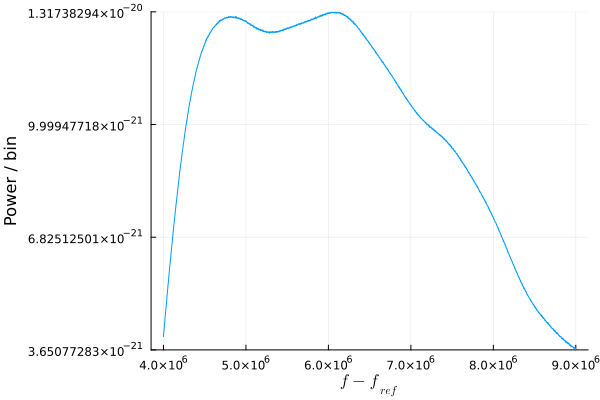

┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\Lenovo\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\Lenovo\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\Lenovo\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194


In [12]:
plot_data(data; key=:pow)

In [13]:
"""
    Subtract (known) ideal background from data.
"""
function id_fit(data)
    data[!,:pownoB] = data[!,:pow] .- data[!,:background]
    return data
end

"""
    Makes a Savitzky Golay polynomial fit and trims the dataset by width/2 at each side if you want to.
"""
function sg_fit(data, order, width; cut=true, overwrite=false)
    b=Int(trunc(width/2))
    e=length(data[!, :freq]) - Int(trunc(width/2))

    # For stability reasons normalize data before SG fit
    sc = mean(data[!, :pow])

    sg = savitzky_golay(data[!, :pow] ./ sc, width, order)
    
    if cut == true
        data = data[b:e,:]
        ft = sg.y[b:e]
    else
        ft = sg.y
    end
    insertcols!(data, :pownoB => data[!, :pow] ./ sc - ft; makeunique=overwrite)
    data[!, :pownoB] .*= sc
    return data
end

sg_fit

In [14]:
BGfit_dict = Dict(
    "type" => "SG",
    "width" => 221,
    "order" => 4
)

data = sg_fit(data, BGfit_dict["order"], BGfit_dict["width"]; cut=true)
#data = id_fit(data)

Row,freq,pow,noise,background,axion,pownoB
,Float64,Float64,Float64,Float64,Float64,Float64
1,4.218e6,9.05851e-21,2.31595e-23,9.03535e-21,0.0,2.43111e-23
2,4.22e6,9.06153e-21,-1.01052e-23,9.07164e-21,0.0,-8.99499e-24
3,4.222e6,9.10538e-21,-2.34652e-24,9.10773e-21,0.0,-1.38772e-24
4,4.224e6,9.1413e-21,-2.32108e-24,9.14362e-21,0.0,-1.19491e-24
5,4.226e6,9.20042e-21,2.11081e-23,9.17931e-21,0.0,2.22807e-23
6,4.228e6,9.21241e-21,-2.39648e-24,9.2148e-21,0.0,-1.13514e-24
7,4.23e6,9.25455e-21,4.45376e-24,9.25009e-21,0.0,5.67051e-24
8,4.232e6,9.2662e-21,-1.89783e-23,9.28518e-21,0.0,-1.79042e-23
9,4.234e6,9.31436e-21,-5.70966e-24,9.32007e-21,0.0,-4.75864e-24


┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\Lenovo\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\Lenovo\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\Lenovo\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\Lenovo\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194


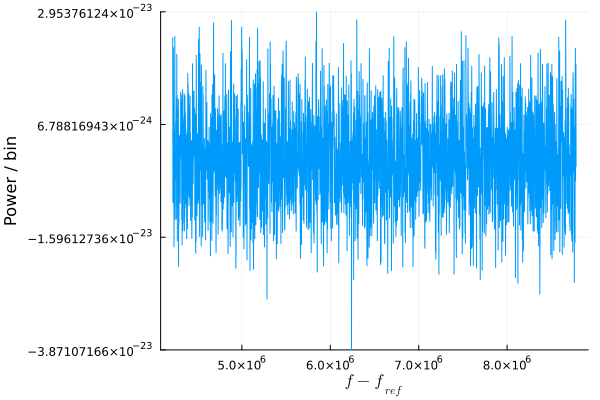

┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\Lenovo\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\Lenovo\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\Lenovo\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194


In [15]:
plot_data(data; key=:pownoB)

# Likelihood

In [17]:
"""
    Compute the signal expectation. If BGfit is defined takes effect of BG fit on signal model into account.
"""
function fit_function(th::Theory, freq, ex::Experiment; BGfit=nothing)
    ff = Power.(signal_counts_bin(freq .+ ex.f_ref, th, ex), freq .+ ex.f_ref, ex.t_int)

    if BGfit === nothing || BGfit["type"] == "ID" || maximum(abs.(ff)) == 0.0
        nothing
    elseif BGfit["type"] == "SG"
        nff = savitzky_golay(ff ./ maximum(ff), BGfit["width"], BGfit["order"])
        ff .-= nff.y .* maximum(ff)
    else
        error("You used an unexpected argument for kwarg BGfit! Use dict with a 'type' parameter called 'ID' or 'SG'!")
    end
    return ff
end

function fit_function(p::NamedTuple, freq, ex::Experiment; BGfit=nothing)
    th = _prepare_th(p)
    fit_function(th, freq, ex; BGfit=BGfit)
end

function _prepare_th(p::NamedTuple{(:ma, :sig_v, :rhoa,)})
    return Theory(ma=p.ma,rhoa=p.rhoa,EoverN=0.92,σ_v=p.sig_v)
end

function _prepare_th(p::NamedTuple{(:ma, :sig_v, :gag,)})
    EoN = EoverN(fa(scale_ma(p.ma)),p.gag)
    return Theory(ma=p.ma,rhoa=0.3,EoverN=EoN,σ_v=p.sig_v)
end

function _prepare_th(p::NamedTuple{(:ma, :sig_v, :Cag,)})
    EoN = p.Cag + 1.92
    return Theory(ma=p.ma,rhoa=0.3,EoverN=EoN,σ_v=p.sig_v)
end

function _prepare_th(p::NamedTuple{(:ma, :sig_v, :log_gag,)})
    gag=10.0^p.log_gag
    EoN = EoverN(fa(scale_ma(p.ma)),gag)
    return Theory(ma=p.ma,rhoa=0.3,EoverN=EoN,σ_v=p.sig_v)
end

# Rhoa and Cag are two completely degenerate parameters. In reality only a combined prior is sensible.
# But to implement this, it is easier to adapt to the rest of the program and forcefully cut out a random value for rhoa, e.g. 0.3. It will not matter for our result in any way.
function _prepare_th(p::NamedTuple{(:ma, :sig_v, :CagxsqrtRhoa,)})
    EoN = p.CagxsqrtRhoa / sqrt(0.45) + 1.92
    return Theory(ma=p.ma,rhoa=0.45,EoverN=EoN,σ_v=p.sig_v)
end

function make_like(data, fit_function, ex, bg)
    likelihood = let freqs=collect(data[!, :freq]), observation=data[!, :pownoB], f=fit_function, ex=ex, BGfit=bg
        function logl(pars) 
            expectation = f(pars, freqs, ex, BGfit=BGfit)
            result = logpdf.(Normal.(expectation, std(observation)), observation)
            return LogDVal(sum(result))
        end
    end
    return likelihood
end


#=
using LogExpFunctions

samp_likelihood = let freqs=collect(data[!, :freq]), observation=Matrix(data[!, r"pownoB_"]), f=fit_function, ex=ex
    function logl(pars) 
        #println(pars)
        expectation = f(pars, freqs, ex) # 80 μs
        # Cant work with values below 0. Should only happen far away from likelihood maximum anyways
        #expectation[expectation .<= 0] .= eps(eltype(expectation))
        # Power.(sqrt.(Counts.(expectation, kwargs[:f_ref].+data[1:end,1], kwargs[:int_time])), kwargs[:f_ref].+data[1:end,1], kwargs[:int_time])
        result = logpdf.(Normal.(expectation, std(observation, dims=1)), observation) # 20 μs
        return LogDVal(sum(logsumexp(result, dims=2)))
    end
end
=#

make_like (generic function with 1 method)

┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\Lenovo\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\Lenovo\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194


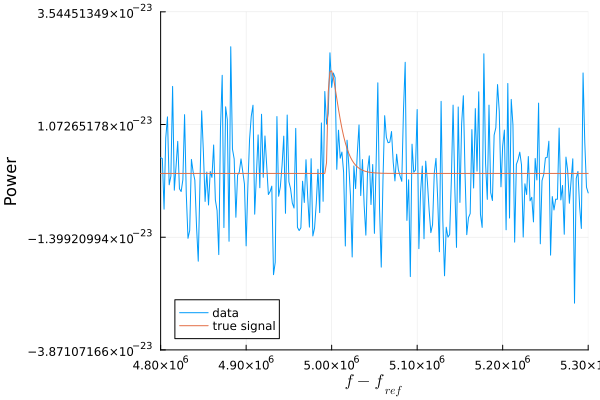

┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\Lenovo\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\Lenovo\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\Lenovo\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\Lenovo\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\Lenovo\.julia\packages\PlotUtils\dVEMd\src\ticks.jl:194


In [18]:
plot_truths(data, signal, ex; xrange=(4.8e6,5.3e6))